# Transient volumetric path tracing: Cornell Box with participative media

## Overview
In this tutorial, you will render your very first **transient image** using `mitransient`!

<div class="admonition important alert alert-block alert-warning">

This tutorial is very similar to the diffuse Cornell Box. We modify both cubes so that they contain a participative medium inside. But the logic to load/render the scene is the same, we only modify the XML file [which you can check here](https://github.com/diegoroyo/mitransient/tree/main/examples/transient/cornell-box). The results are pretty cool though :)

</div>

<div class="admonition important alert alert-block alert-success">

🚀 **You will learn how to:**

<ul>
  <li>Import `mitransient`</li>
  <li>Setup and render a Cornell Box scene in the transient domain</li>
  <li>Visualize the output video</li>
</ul>

</div>

### Importing `mitransient`
Before importing `mitransient`, you need to import Mitsuba 3 and set a variant (here we use `llvm_ad_rgb`). Only if you want to use more variants, you will need to compile Mitsuba 3 (not `mitransient`) yourself. And you will need to add the compilation folder to the `PYTHONPATH` (see the commented code for how to do that)

<div class="admonition important alert alert-block alert-warning">

For many cases, `mitransient` requires the use of a `llvm_*` or `cuda_*` variant, so we don't recommend using `scalar_rgb`. It will work with any `llvm_*` or `cuda_*` variant, and for most use cases `llvm_ad_rgb` or `cuda_ad_rgb` is enough.

</div>

In [1]:
# If you have compiled Mitsuba 3 yourself, you will need to specify the path
# to the compilation folder
# import sys
# sys.path.insert(0, '<mitsuba-path>/mitsuba3/build/python')
import mitsuba as mi
# To set a variant, you need to have set it in the mitsuba.conf file
# https://mitsuba.readthedocs.io/en/latest/src/key_topics/variants.html
mi.set_variant('llvm_ad_rgb')

import mitransient as mitr

We use the short alias `mitr` for `mitransient` for improved code readibility.

### Setup the Cornell Box scene

Scene data is represented using plugins. Each plugin can model geometry, materials, camera, lights, etc. Mitsuba 3 uses a XML format to represent the content of their scenes as a hierarchy of plugins (for example, the `sensor` plugin is a camera that contains a `film` plugin that stores the resulting image). You can check the `cbox_diffuse.xml` to see how it's structured. Concretely, `mitransient` provides new plugins that work in the transient domain such as `transient_path`, `transient_hdr_film`, etc.

Here we use the `mi.load_file` function, which takes a XML file path as input. But you can also use `mi.load_dict`, which takes a Python dictionary object. Choose whatever is easier for you. We provide a `mitr.cornell_box()` function which can be used to load a Cornell Box like the one in this example: `mi.load_dict(mitr.cornell_box())`

In [2]:
# Load XML file
# You can also use mi.load_dict and pass a Python dict object
# but it is probably much easier for your work to use XML files
import os
scene = mi.load_file(os.path.abspath('transient-vol/cbox_volumetric.xml'))

The only difference with a conventional (steady state) scene is that a transient scene must use a [transient integrator](https://mitransient.readthedocs.io/en/latest/generated/plugin_reference/section_integrators.html#integrators) and a [transient film](https://mitransient.readthedocs.io/en/latest/generated/plugin_reference/section_films.html#films).

### Render the scene in steady and transient domain

<div class="admonition important alert alert-block alert-warning">
Mitsuba 3 and `mitransient` work with Dr.JIT, which has lazy evaluation.
That means the actual image/video will not be computed until you use it.
As such, this cell should take &lt;1s to execute
</div>

In [3]:
data_steady, data_transient = mi.render(scene, spp=1024)

In [4]:
print(data_steady.shape, data_transient.shape)

(256, 256, 3) (256, 256, 400, 3)


The result is:
1) A steady state image `data_steady` with dimensions (width, height, channels)
2) A transient image `data_transient` with dimensions (width, height, time, channels)

`data_steady` would be the result of a conventional (non-transient) render i.e. `data_steady = data_transient.sum(axis=2)`

### Visualize the steady and transient image
We provide different functions so you can visualize your data in a Jupyter notebook

In [6]:
# Plot the computed steady image
mi.util.convert_to_bitmap(data_steady)

Bitmap[
  pixel_format = rgb,
  component_format = uint8,
  size = [256, 256],
  srgb_gamma = 1,
  struct = Struct<3>[
    uint8 R; // @0, normalized, gamma, premultiplied alpha
    uint8 G; // @1, normalized, gamma, premultiplied alpha
    uint8 B; // @2, normalized, gamma, premultiplied alpha
  ],
  data = [ 192 KiB of image data ]
]

<div class="admonition important alert alert-block alert-warning">
You will see that the `show_video` function takes some seconds to execute.
In reality most of this time is spent rendering the transient image, as was explained before.
</div>

In [8]:
# Plot the computed transient image as a video
data_transient_tonemapped = mitr.vis.tonemap_transient(data_transient)

mitr.vis.show_video(
    data_transient_tonemapped,
    axis_video=2,
)

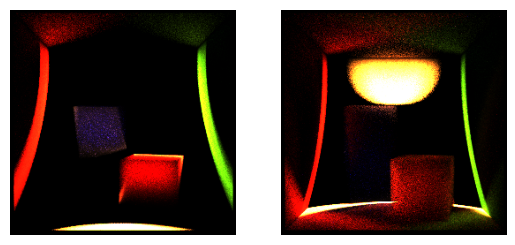

In [9]:
# Plot some frames of the computed transient image
import matplotlib.pyplot as plt

data_transient_tonemapped[data_transient_tonemapped > 1] = 1

plt.subplot(1, 2, 1)
plt.axis("off")
plt.imshow(data_transient_tonemapped[:, :, 70])
plt.subplot(1, 2, 2)
plt.axis("off")
plt.imshow(data_transient_tonemapped[:, :, 100])
plt.show()

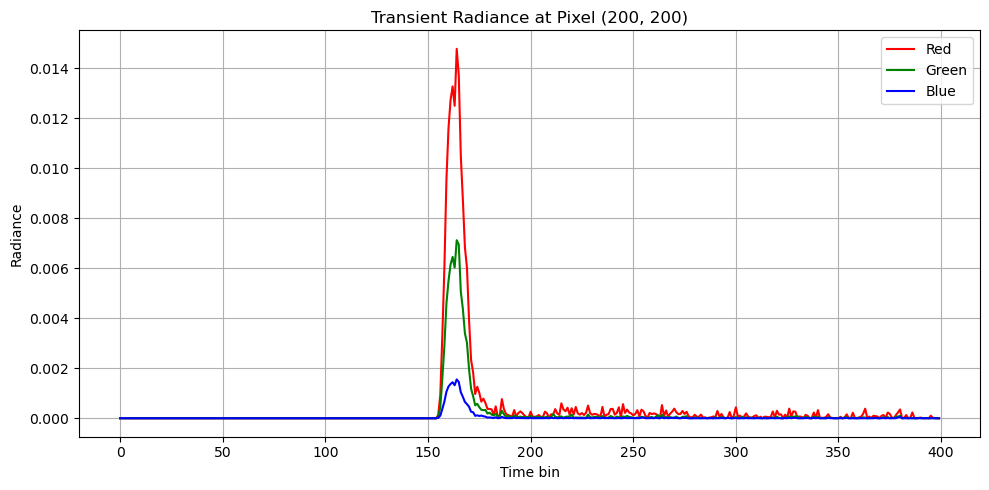

In [12]:
# Choose a pixel
i, j = 200, 200  # or any pixel in bounds

# Extract the Mitsuba tensor (shape: [T, 3])
radiance_profile = data_transient[i, j, :, :]

# Convert to NumPy
radiance_profile_np = mi.TensorXf(radiance_profile).numpy()

# Plot each color channel
plt.figure(figsize=(10, 5))
plt.plot(radiance_profile_np[:, 0], label='Red', color='red')
plt.plot(radiance_profile_np[:, 1], label='Green', color='green')
plt.plot(radiance_profile_np[:, 2], label='Blue', color='blue')

plt.title(f"Transient Radiance at Pixel ({i}, {j})")
plt.xlabel("Time bin")
plt.ylabel("Radiance")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [20]:
# Choose a pixel (row i, column j)
i, j = 150, 150

# Extract and convert to NumPy
radiance_profile = mi.TensorXf(data_transient[i, j, :, :]).numpy()

# Print first 10 time bins
for t in range(170, 180):
    r, g, b = radiance_profile[t]
    print(f"Time bin {t:2d}: R={r:.4f}, G={g:.4f}, B={b:.4f}")

Time bin 170: R=0.0003, G=0.0001, B=0.0000
Time bin 171: R=0.0002, G=0.0001, B=0.0000
Time bin 172: R=0.0003, G=0.0002, B=0.0000
Time bin 173: R=0.0006, G=0.0004, B=0.0001
Time bin 174: R=0.0014, G=0.0004, B=0.0001
Time bin 175: R=0.0015, G=0.0005, B=0.0001
Time bin 176: R=0.0020, G=0.0007, B=0.0001
Time bin 177: R=0.0014, G=0.0005, B=0.0001
Time bin 178: R=0.0016, G=0.0007, B=0.0001
Time bin 179: R=0.0013, G=0.0006, B=0.0001
